## This is the first notebook done after the hackathon
### I'm using a different approach to calculating features (more array and vector based and less row and loop based) which is speeding up the calculation. 
### The thought process is the same
#### - Justin

In [1]:
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
%matplotlib inline
import welly
from welly import Well
import lasio
import glob
from sklearn import neighbors
import pickle
import math
welly.__version__

'0.3.0'

In [2]:
%%timeit
import os
env = %env


103 µs ± 1.58 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [3]:
from IPython.display import display

In [4]:
#### Test results Part 1
#### Had to change display options to get this to print in full!
pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.options.display.max_colwidth = 100000

## We're going to load a pickle file of a previously created dataframe

### The dataframe merges:
1. picks_dic = pd.read_csv('../../SPE_006_originalData/OilSandsDB/PICKS_DIC.TXT',delimiter='\t')
2. picks = pd.read_csv('../../SPE_006_originalData/OilSandsDB/PICKS.TXT',delimiter='\t')
3. wells = pd.read_csv('../../SPE_006_originalData/OilSandsDB/WELLS.TXT',delimiter='\t')
4. gis = pd.read_csv('../../well_lat_lng.csv')

### It also excludes any wells that have nulls or zeros for Top McMurray or Base McMurray picks
This was done in notebooks: 
1. notebooks_2018/mapmaking/Map_Exploration_v2-KDtree.ipynb
2. notebooks_2018/Test_RUN_2018_02/DataCleaningPrepof_KNN_neighborPickDepth_df_creation_vA_20180210

### Let's load in the pickle file of the dataframe from previous notebook mentioned above

In [5]:
wells_df_new_cleaned_plus_nn_wNoNulls =  pd.read_pickle('wells_df_new_cleaned_plus_nn_wNoNulls.p')

In [6]:
wells_df_new_cleaned_plus_nn_wNoNulls.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1921 entries, 0 to 2192
Data columns (total 16 columns):
SitID                                  1921 non-null int64
McMurray_Base_HorID                    1921 non-null int64
McMurray_Top_HorID                     1921 non-null int64
McMurray_Base_DEPTH                    1921 non-null float64
McMurray_Top_DEPTH                     1921 non-null float64
McMurray_Base_Qual                     1921 non-null int64
McMurray_Top_Qual                      1921 non-null int64
lat                                    1921 non-null float64
lng                                    1921 non-null float64
UWI                                    1921 non-null object
Neighbors_Obj                          1921 non-null object
NN1_McMurray_Top_DEPTH                 1921 non-null float64
NN1_McMurray_Base_DEPTH                1921 non-null float64
NN1_thickness                          1921 non-null float64
MM_Top_Depth_predBy_NN1thick           1921 non-nul

In [7]:
wells_df_new_cleaned_plus_nn_wNoNulls.head()

,SitID,McMurray_Base_HorID,McMurray_Top_HorID,McMurray_Base_DEPTH,McMurray_Top_DEPTH,McMurray_Base_Qual,McMurray_Top_Qual,lat,lng,UWI,Neighbors_Obj,NN1_McMurray_Top_DEPTH,NN1_McMurray_Base_DEPTH,NN1_thickness,MM_Top_Depth_predBy_NN1thick,MM_Top_Depth_Real_v_predBy_NN1thick
0,102496,14000,13000,561.0,475.0,1,3,54.785907,-110.129320,00/12-08-067-01W4/0,"[{'distance': 0.05753100195547899, 'UWI': '00/09-11-067-02W4/0', 'neighbor': 1}, {'distance': 0.08749430324884858, 'UWI': '00/11-08-068-01W4/0', 'neighbor': 2}, {'distance': 0.10451669032744222, 'UWI': '00/09-11-068-02W4/0', 'neighbor': 3}, {'distance': 0.1099989647224123, 'UWI': '00/06-34-067-02W4/0', 'neighbor': 4}, {'distance': 0.14017282905400244, 'UWI': '00/07-08-067-02W4/0', 'neighbor': 5}, {'distance': 0.14539497462086076, 'UWI': '00/06-26-068-02W4/0', 'neighbor': 6}, {'distance': 0.14676425482044453, 'UWI': '00/10-29-067-02W4/0', 'neighbor': 7}]",544.0,630.0,86.0,475.0,0.0
1,102497,14000,13000,604.5,515.0,1,3,54.782284,-110.269446,00/07-08-067-02W4/0,"[{'distance': 0.04734000608365529, 'UWI': '00/10-29-067-02W4/0', 'neighbor': 1}, {'distance': 0.07332213830078355, 'UWI': '00/06-34-067-02W4/0', 'neighbor': 2}, {'distance': 0.07725585850924727, 'UWI': '00/07-36-067-03W4/0', 'neighbor': 3}, {'distance': 0.07846755926496476, 'UWI': '00/10-14-067-03W4/0', 'neighbor': 4}, {'distance': 0.08267376663125782, 'UWI': '00/09-11-067-02W4/0', 'neighbor': 5}, {'distance': 0.09089701215112062, 'UWI': '00/10-08-068-02W4/0', 'neighbor': 6}, {'distance': 0.11681159403073145, 'UWI': '00/06-13-068-03W4/0', 'neighbor': 7}]",529.0,613.0,84.0,520.5,-5.5
2,102498,14000,13000,564.0,480.0,1,3,54.785892,-110.186851,00/09-11-067-02W4/0,"[{'distance': 0.05753100195547899, 'UWI': '00/12-08-067-01W4/0', 'neighbor': 1}, {'distance': 0.06649378619088428, 'UWI': '00/06-34-067-02W4/0', 'neighbor': 2}, {'distance': 0.08267376663125782, 'UWI': '00/07-08-067-02W4/0', 'neighbor': 3}, {'distance': 0.08728400165551212, 'UWI': '00/09-11-068-02W4/0', 'neighbor': 4}, {'distance': 0.09343691917544036, 'UWI': '00/10-29-067-02W4/0', 'neighbor': 5}, {'distance': 0.10808166919974113, 'UWI': '00/11-08-068-01W4/0', 'neighbor': 6}, {'distance': 0.12013967631468725, 'UWI': '00/10-08-068-02W4/0', 'neighbor': 7}]",529.0,613.0,84.0,480.0,0.0
3,102500,14000,13000,636.5,549.0,1,3,54.829624,-110.269422,00/10-29-067-02W4/0,"[{'distance': 0.04355700607250212, 'UWI': '00/10-08-068-02W4/0', 'neighbor': 1}, {'distance': 0.04589036401030715, 'UWI': '00/06-34-067-02W4/0', 'neighbor': 2}, {'distance': 0.04734000608365529, 'UWI': '00/07-08-067-02W4/0', 'neighbor': 3}, {'distance': 0.052016152587450945, 'UWI': '00/07-36-067-03W4/0', 'neighbor': 4}, {'distance': 0.07898840474399109, 'UWI': '00/06-13-068-03W4/0', 'neighbor': 5}, {'distance': 0.08169505420160347, 'UWI': '00/10-14-067-03W4/0', 'neighbor': 6}, {'distance': 0.08752301126560716, 'UWI': '00/11-29-068-02W4/0', 'neighbor': 7}]",529.0,613.0,84.0,552.5,-3.5
4,102501,14000,13000,613.0,529.0,1,2,54.840471,-110.224832,00/06-34-067-02W4/0,"[{'distance': 0.04589036401030715, 'UWI': '00/10-29-067-02W4/0', 'neighbor': 1}, {'distance': 0.050134469469623355, 'UWI': '00/09-11-068-02W4/0', 'neighbor': 2}, {'distance': 0.055282561346227096, 'UWI': '00/10-08-068-02W4/0', 'neighbor': 3}, {'distance': 0.06649378619088428, 'UWI': '00/09-11-067-02W4/0', 'neighbor': 4}, {'distance': 0.07332213830078355, 'UWI': '00/07-08-067-02W4/0', 'neighbor': 5}, {'distance': 0.07715524006184091, 'UWI': '00/06-26-068-02W4/0', 'neighbor': 6}, {'distance': 0.09180352126144718, 'UWI': '00/11-29-068-02W4/0', 'neighbor': 7}]",514.0,603.0,89.0,524.0,5.0


In [8]:
print(len(wells_df_new_cleaned_plus_nn_wNoNulls))

1921


In [19]:
wells_df_new_cleaned_plus_nn_wNoNulls.head()

,SitID,McMurray_Base_HorID,McMurray_Top_HorID,McMurray_Base_DEPTH,McMurray_Top_DEPTH,McMurray_Base_Qual,McMurray_Top_Qual,lat,lng,UWI,Neighbors_Obj,NN1_McMurray_Top_DEPTH,NN1_McMurray_Base_DEPTH,NN1_thickness,MM_Top_Depth_predBy_NN1thick,MM_Top_Depth_Real_v_predBy_NN1thick
0,102496,14000,13000,561.0,475.0,1,3,54.785907,-110.129320,00/12-08-067-01W4/0,"[{'neighbor': 1, 'UWI': '00/09-11-067-02W4/0', 'distance': 0.05753100195547899}, {'neighbor': 2, 'UWI': '00/11-08-068-01W4/0', 'distance': 0.08749430324884858}, {'neighbor': 3, 'UWI': '00/09-11-068-02W4/0', 'distance': 0.10451669032744222}, {'neighbor': 4, 'UWI': '00/06-34-067-02W4/0', 'distance': 0.1099989647224123}, {'neighbor': 5, 'UWI': '00/07-08-067-02W4/0', 'distance': 0.14017282905400244}, {'neighbor': 6, 'UWI': '00/06-26-068-02W4/0', 'distance': 0.14539497462086076}, {'neighbor': 7, 'UWI': '00/10-29-067-02W4/0', 'distance': 0.14676425482044453}]",544.0,630.0,86.0,475.0,0.0
1,102497,14000,13000,604.5,515.0,1,3,54.782284,-110.269446,00/07-08-067-02W4/0,"[{'neighbor': 1, 'UWI': '00/10-29-067-02W4/0', 'distance': 0.04734000608365529}, {'neighbor': 2, 'UWI': '00/06-34-067-02W4/0', 'distance': 0.07332213830078355}, {'neighbor': 3, 'UWI': '00/07-36-067-03W4/0', 'distance': 0.07725585850924727}, {'neighbor': 4, 'UWI': '00/10-14-067-03W4/0', 'distance': 0.07846755926496476}, {'neighbor': 5, 'UWI': '00/09-11-067-02W4/0', 'distance': 0.08267376663125782}, {'neighbor': 6, 'UWI': '00/10-08-068-02W4/0', 'distance': 0.09089701215112062}, {'neighbor': 7, 'UWI': '00/06-13-068-03W4/0', 'distance': 0.11681159403073145}]",529.0,613.0,84.0,520.5,-5.5
2,102498,14000,13000,564.0,480.0,1,3,54.785892,-110.186851,00/09-11-067-02W4/0,"[{'neighbor': 1, 'UWI': '00/12-08-067-01W4/0', 'distance': 0.05753100195547899}, {'neighbor': 2, 'UWI': '00/06-34-067-02W4/0', 'distance': 0.06649378619088428}, {'neighbor': 3, 'UWI': '00/07-08-067-02W4/0', 'distance': 0.08267376663125782}, {'neighbor': 4, 'UWI': '00/09-11-068-02W4/0', 'distance': 0.08728400165551212}, {'neighbor': 5, 'UWI': '00/10-29-067-02W4/0', 'distance': 0.09343691917544036}, {'neighbor': 6, 'UWI': '00/11-08-068-01W4/0', 'distance': 0.10808166919974113}, {'neighbor': 7, 'UWI': '00/10-08-068-02W4/0', 'distance': 0.12013967631468725}]",529.0,613.0,84.0,480.0,0.0
3,102500,14000,13000,636.5,549.0,1,3,54.829624,-110.269422,00/10-29-067-02W4/0,"[{'neighbor': 1, 'UWI': '00/10-08-068-02W4/0', 'distance': 0.04355700607250212}, {'neighbor': 2, 'UWI': '00/06-34-067-02W4/0', 'distance': 0.04589036401030715}, {'neighbor': 3, 'UWI': '00/07-08-067-02W4/0', 'distance': 0.04734000608365529}, {'neighbor': 4, 'UWI': '00/07-36-067-03W4/0', 'distance': 0.052016152587450945}, {'neighbor': 5, 'UWI': '00/06-13-068-03W4/0', 'distance': 0.07898840474399109}, {'neighbor': 6, 'UWI': '00/10-14-067-03W4/0', 'distance': 0.08169505420160347}, {'neighbor': 7, 'UWI': '00/11-29-068-02W4/0', 'distance': 0.08752301126560716}]",529.0,613.0,84.0,552.5,-3.5
4,102501,14000,13000,613.0,529.0,1,2,54.840471,-110.224832,00/06-34-067-02W4/0,"[{'neighbor': 1, 'UWI': '00/10-29-067-02W4/0', 'distance': 0.04589036401030715}, {'neighbor': 2, 'UWI': '00/09-11-068-02W4/0', 'distance': 0.050134469469623355}, {'neighbor': 3, 'UWI': '00/10-08-068-02W4/0', 'distance': 0.055282561346227096}, {'neighbor': 4, 'UWI': '00/09-11-067-02W4/0', 'distance': 0.06649378619088428}, {'neighbor': 5, 'UWI': '00/07-08-067-02W4/0', 'distance': 0.07332213830078355}, {'neighbor': 6, 'UWI': '00/06-26-068-02W4/0', 'distance': 0.07715524006184091}, {'neighbor': 7, 'UWI': '00/11-29-068-02W4/0', 'distance': 0.09180352126144718}]",514.0,603.0,89.0,524.0,5.0


In [20]:
df_new = wells_df_new_cleaned_plus_nn_wNoNulls
# df_new["UWI (AGS)"] = df_new["UWI (AGS)_x"]
df_new["UWI"] = df_new["UWI"]
df_new["HorID"] = df_new["McMurray_Top_HorID"]
df_new["Pick"] = df_new["McMurray_Top_DEPTH"]
df_new["Quality"] = df_new["McMurray_Top_Qual"]
df_new["HorID_paleoz"] = df_new["McMurray_Base_HorID"]
df_new["Pick_paleoz"] = df_new["McMurray_Base_DEPTH"]
df_new["Quality_paleoz"] = df_new["McMurray_Base_Qual"]
df_new = df_new[["SitID","UWI","HorID","Pick","Quality","HorID_paleoz","Pick_paleoz","Quality_paleoz",'lat','lng','MM_Top_Depth_predBy_NN1thick','NN1_thickness']]
df_new

,SitID,UWI,HorID,Pick,Quality,HorID_paleoz,Pick_paleoz,Quality_paleoz,lat,lng,MM_Top_Depth_predBy_NN1thick,NN1_thickness
0,102496,00/12-08-067-01W4/0,13000,475.00,3,14000,561.00,1,54.785907,-110.129320,475.00,86.00
1,102497,00/07-08-067-02W4/0,13000,515.00,3,14000,604.50,1,54.782284,-110.269446,520.50,84.00
2,102498,00/09-11-067-02W4/0,13000,480.00,3,14000,564.00,1,54.785892,-110.186851,480.00,84.00
3,102500,00/10-29-067-02W4/0,13000,549.00,3,14000,636.50,1,54.829624,-110.269422,552.50,84.00
4,102501,00/06-34-067-02W4/0,13000,529.00,2,14000,613.00,1,54.840471,-110.224832,524.00,89.00
5,102503,00/11-04-067-03W4/0,13000,488.50,2,14000,553.50,1,54.771449,-110.402983,489.00,64.50
6,102505,00/10-08-067-03W4/0,13000,501.50,2,14000,572.50,1,54.785901,-110.422131,508.00,64.50
7,102507,00/10-14-067-03W4/0,13000,553.50,2,14000,606.50,1,54.800533,-110.345762,542.00,64.50
8,102514,00/10-28-067-03W4/0,13000,493.50,3,14000,558.00,1,54.829633,-110.396621,487.00,71.00
9,102517,00/07-36-067-03W4/0,13000,536.50,2,14000,615.00,1,54.840441,-110.320301,562.00,53.00


In [21]:
print(len(df_new))

1921


In [22]:
#### Number of unique wells based on UWI
len(df_new.UWI.unique())

1921

In [23]:
df_new_test = df_new[['UWI']]

In [24]:
print(any(df_new_test.UWI == '00/11-04-067-03W4/0'))

True


## Brainstorm 1 : various features to extract
1. Find average values of [each curve] in [different] length windows [above, around, below] a depth
2. Find average for [different number of] [max, min] values in [different] length windows [above, around, below] a depth for [each curve]
3. Find gradient within [window length] around a depth point 
4. Find [min, avg, max] gradient of various [smaller window length] within a larger [larger window length]
5. Find number of gradient changes (negative to positive) of various [smaller window length] within a larger [larger window length]
6. Find difference between two windows on either side of a given depth. For each window, average for [different number of] [max, min] values in [different] length windows above & below a given depth for [each curve].

In [25]:
####
def addColWindowMean(df,col,windowSize,centered):
    featureName = col+"_mean_"+str(windowSize)+"winSize_"+"dir"+centered
    if(centered == "around"):
        df[featureName] = df[col].rolling(center=True,window=windowSize).mean() 
    elif(centered == "above"):
        df[featureName] = df[col].rolling(center=False,window=windowSize).mean() 
    elif(centered == "below"):
        #### reverse data frame
        #df = df.iloc[::-1]
        df = df.sort_index(ascending=False)
        df[featureName] = df[col].rolling(center=False,window=windowSize).mean() 
        #### unreverse
        df = df.sort_index(ascending=True)
    return df

In [26]:
####
def addColWindowMax(df,col,windowSize,centered):
    featureName = col+"_max_"+str(windowSize)+"winSize_"+"dir"+centered
    if(centered == "around"):
        df[featureName] = df[col].rolling(center=True,window=windowSize).max() 
    elif(centered == "above"):
        df[featureName] = df[col].rolling(center=False,window=windowSize).max() 
    elif(centered == "below"):
        #### reverse data frame
        #df = df.iloc[::-1]
        df = df.sort_index(ascending=False)
        df[featureName] = df[col].rolling(center=False,window=windowSize).max() 
        #### unreverse
        df = df.sort_index(ascending=True)
    return df

In [27]:
#### Returns a column with the min values of a window centered 
def addColWindowMin(df,col,windowSize,centered):
    featureName = col+"_min_"+str(windowSize)+"winSize_"+"dir"+centered
    if(centered == "around"):
        df[featureName] = df[col].rolling(center=True,window=windowSize).min() 
    elif(centered == "above"):
        df[featureName] = df[col].rolling(center=False,window=windowSize).min() 
    elif(centered == "below"):
        #### reverse data frame
        #df = df.iloc[::-1]
        df = df.sort_index(ascending=False)
        df[featureName] = df[col].rolling(center=False,window=windowSize).min() 
        #### unreverse
        
        df = df.sort_index(ascending=True)
    return df

In [28]:
#### helper function that takes in array and an integer for the number of highest values to find the mean of 
#### example: for an array = [1,3,6,44,33,22,452] and nValues = 2, the answer would be 44+452 / 2
def nLargest(array,nValues):
    answer = np.mean(array[np.argsort(array)[-nValues:]])  
    return answer

In [29]:
#### Returns a column with the average of the N largest values of a window 
def addColWindowAvgMaxNvalues(df,col,windowSize,centered,nValues):
    #df[featureName] = df[col].rolling(center=True,window=windowSize).nlargest(nValues).mean() 
    #return df
    featureName = col+"_min_"+str(windowSize)+"winSize_"+"dir"+centered+"_n"+str(nValues)
    if(centered == "around"):
        #df[featureName] = df[col].rolling(center=True,window=windowSize).nlargest(nValues).mean() 
        df[featureName] = df[col].rolling(center=True,window=windowSize).apply(lambda x: nLargest(x,nValues))
    elif(centered == "above"):
        df[featureName] = df[col].rolling(center=False,window=windowSize).apply(lambda x: nLargest(x,nValues))
    elif(centered == "below"):
        #### reverse data frame
        #df = df.iloc[::-1]
        df = df.sort_index(ascending=False)
        #   # df['new_column'] = df.apply(lambda x: your_function(x['High'],x['Low'],x['Close']), axis=1)
        df[featureName] = df[col].rolling(center=False,window=windowSize).apply(lambda x: nLargest(x,nValues))
        #df[featureName] = df[col].rolling(center=False,window=windowSize).nlargest(nValues).mean() 
        #### unreverse
        df = df.sort_index(ascending=True)
    return df

In [30]:
#### Takes MM_Top_Depth_predBy_NN1thick and subtracts depth at that point, returns value
def NN1_TopMcMDepth(df,MM_Top_Depth_predBy_NN1thick):
    df['DistFrom_NN1_TopDepth'] = df[MM_Top_Depth_predBy_NN1thick] - df['DEPT'] 
    return df


In [31]:
#### Takes MM_Top_Depth_predBy_NN1thick and subtracts depth at that point, returns *absolute* value
def NN1_TopMcMDepth_Abs(df,MM_Top_Depth_predBy_NN1thick):
    df['DistFrom_NN1_TopDepth_Abs'] = math.fabs(df[MM_Top_Depth_predBy_NN1thick] - df['DEPT'])
    return df

In [32]:
####
winVars = {"RangeOfCurves":['GR'],
                   "RangeOfWindows":[5,11,29],
                   "RangeOfWindowsCaution":[5],
                   "RangeOfDirection":['above','below','around'],
                   "MinOrMaxRange":['min','max'],
                   "NumbPtsRange":[1,5]}

## Read in well logs from LAS files and put into Dictionary of Dataframes. As Reading-in, add features

In [34]:
def loadAndAddFeatures():
    count=0
    data_df=[]
    count_limit =1663
    list_of_failed_wells = []
    ### dictionary that holds every well as key:value or "UWI":df pair
    df_w_dict ={}
    while count < count_limit:
        for file in glob.glob('../../SPE_006_originalData/OilSandsDB/Logs/*.LAS'):
            #### NOTE: limiting wells being read-in to 101 here !!!!!!!!!!!!!!!!
            count+=1
            if count > count_limit:
                print("hit limit of count below file for loop")
                answer = [df_w_dict,list_of_failed_wells]
                return answer
            else:
                l_df = lasio.read(file).df()
                #print(l_df)
                str_uwi= file[-23:-4].replace("-", "/",1)[:17]+file[-6:-4].replace("-", "/",1)
                #l_df.DEPT = l_df.DEPT.astype(float)
                ##bottom_well_depth = l_df['DEPT'].max()
                if any(df_new.UWI == str_uwi):
                    if df_new[df_new['UWI']==str_uwi]['Quality'].iloc[0] > -1:
                        l_df = l_df.reset_index()
                        print("got to UWI apppend")
                        l_df['UWI'] = str_uwi
                        print("UWI added is ",str_uwi," and type is ",type(str_uwi))
                        l_df['SitID']=df_new[df_new['UWI']==str_uwi]['SitID'].iloc[0]
#                         l_df['UWI (AGS)']=df_new[df_new['UWI']==str_uwi]['UWI (AGS)'].iloc[0]
                        l_df['Pick']=df_new[df_new['UWI']==str_uwi]['Pick'].iloc[0] 
                        l_df['HorID']=df_new[df_new['UWI']==str_uwi]['HorID'].iloc[0]
                        l_df['Quality']=df_new[df_new['UWI']==str_uwi]['Quality'].iloc[0]
                        #### adding in paleozoic surface pick
                        l_df['Pick_paleoz']=df_new[df_new['UWI']==str_uwi]['Pick_paleoz'].iloc[0] 
                        l_df['HorID_paleoz']=df_new[df_new['UWI']==str_uwi]['HorID_paleoz'].iloc[0]
                        l_df['Quality_paleoz']=df_new[df_new['UWI']==str_uwi]['Quality_paleoz'].iloc[0]
                        
                        #### new as of 2018-02
                        l_df['MM_Top_Depth_predBy_NN1thick']=df_new[df_new['UWI']==str_uwi]['MM_Top_Depth_predBy_NN1thick'].iloc[0]
                        l_df['NN1_thickness']=df_new[df_new['UWI']==str_uwi]['NN1_thickness'].iloc[0]

                        print("got to end of col append & pick is ",l_df.Pick.unique()[0])  
                        try:
                            print("in first try statement, count = ",count)
                            float(l_df.Pick.unique()[0])
                            l_df.Pick = l_df.Pick.astype(float)
                            l_df.DEPT = l_df.DEPT.astype(float)
                            l_df['new_pick']=l_df['Pick']-l_df['DEPT']
#                             l_df['new_pick2']=l_df['new_pick'].apply(lambda x: 1 if(x==0) else 0)
                            l_df['new_pick2']=l_df['new_pick'].apply(lambda x: 10 if x==0 else ( 5 if (-5 < x and x <5) else 0))
#                             lambda x: x*10 if x<2 else (x**2 if x<4 else x+10)
                            #### doing the same as below but for BASE mcMurray or Paleozoic surface pick
                            float(l_df.Pick_paleoz.unique()[0])
                            l_df.Pick_paleoz = l_df.Pick_paleoz.astype(float)
                            #l_df.DEPT = l_df.DEPT.astype(float)
                            l_df['new_pick_paleoz']=l_df['Pick_paleoz']-l_df['DEPT']
                            l_df['new_pick2_paleoz']=l_df['new_pick_paleoz'].apply(lambda x: 1 if(x==0) else 0)
                            
                            #### new as of 2018-02
                            try:
                                l_df_new = NN1_TopMcMDepth(l_df,'MM_Top_Depth_predBy_NN1thick')
                            except:
                                    pass
                            try:
                                l_df_new = NN1_TopMcMDepth_Abs(l_df,'MM_Top_Depth_predBy_NN1thick')
                            except:
                                    pass
                            
                            print("got to below astype part")
                            #### instead of concat into a single dataframe, run functions & then add to dictionary   
                            ##### run functions to create features on array basis for each well in separate dataframe
                            ##### this makes certain things easier, compared to everything in a single dataframe, like making sure you don't accidentally grab data from next well up
                            ##### and will make it easier to write data back to LAS if we run into memory limitations later
                            curves = ['GR','ILD']
                            windows = [5,7,11,21]
                            directions = ["around","below","above"]
                            comboArg_A = [curves,windows,directions]
                            all_comboArgs_A = list(itertools.product(*comboArg_A))
                            for eachArgList in all_comboArgs_A:
                                try:
                                    l_df_new = addColWindowMean(l_df,eachArgList[0],eachArgList[1],eachArgList[2])
                                except:
                                    pass
                                try:
                                    l_df_new = addColWindowMax(l_df,eachArgList[0],eachArgList[1],eachArgList[2])
                                except:
                                    pass
                                try:
                                    l_df_new = addColWindowMin(l_df,eachArgList[0],eachArgList[1],eachArgList[2])
                                except:
                                    pass
                                try:
                                    l_df_new = addColWindowAvgMaxNvalues(l_df,eachArgList[0],eachArgList[1],eachArgList[2],3)
                                except:
                                    pass
                            #### add resultant dataframe to dictionary
                            if l_df['DEPT'].max() < 600:
                                df_w_dict[l_df_new['UWI'][0]]= l_df_new
                        except ValueError as e:
                            print("e = ",e)
                            print ('Error picking')
                            template = "An exception of type {0} occurred. Arguments:\n{1!r}"
                            message = template.format(type(e).__name__, e.args)
                            print("message = ",message)
                            print("file = ",file)
                            print("Got except, UWI added is ",str_uwi," and type is ",type(str_uwi))
                            list_of_failed_wells.append(str_uwi)
                            #continue;
                    else:
                        pass
                else:
                    pass
            #print("result = ",df_w_dict)
    #else: 
    #    return df_w_dict, list_of_failed_wells
    answer = [df_w_dict,list_of_failed_wells]
    
    return answer

In [35]:
## %timeit
answer = loadAndAddFeatures()

got to UWI apppend
UWI added is  00/01-01-073-05W5/0  and type is  <class 'str'>
got to end of col append & pick is  607.0
in first try statement, count =  1
got to below astype part
got to UWI apppend
UWI added is  00/01-03-085-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  243.0
in first try statement, count =  3
got to below astype part
got to UWI apppend
UWI added is  00/01-04-075-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  631.0
in first try statement, count =  4
got to below astype part
got to UWI apppend
UWI added is  00/01-05-085-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  253.0
in first try statement, count =  5
got to below astype part
got to UWI apppend
UWI added is  00/01-08-080-21W4/0  and type is  <class 'str'>
got to end of col append & pick is  411.0
in first try statement, count =  6
got to below astype part
got to UWI apppend
UWI added is  00/01-09-080-13W4/0  and type is  <class 'str'>
got 

got to UWI apppend
UWI added is  00/03-07-071-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  473.0
in first try statement, count =  55
got to below astype part
got to UWI apppend
UWI added is  00/03-09-075-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  596.5
in first try statement, count =  56
got to below astype part
got to UWI apppend
UWI added is  00/03-10-088-03W4/0  and type is  <class 'str'>
got to end of col append & pick is  149.96
in first try statement, count =  57
got to below astype part
got to UWI apppend
UWI added is  00/03-11-080-08W4/0  and type is  <class 'str'>
got to end of col append & pick is  355.5
in first try statement, count =  58
got to below astype part
got to UWI apppend
UWI added is  00/03-12-077-08W4/0  and type is  <class 'str'>
got to end of col append & pick is  323.5
in first try statement, count =  59
got to below astype part
got to UWI apppend
UWI added is  00/03-12-095-16W4/0  and type is  <class 'str'

got to UWI apppend
UWI added is  00/04-30-078-13W4/0  and type is  <class 'str'>
got to end of col append & pick is  451.5
in first try statement, count =  114
got to below astype part
got to UWI apppend
UWI added is  00/04-30-078-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  475.0
in first try statement, count =  115
got to below astype part
got to UWI apppend
UWI added is  00/04-30-083-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  291.0
in first try statement, count =  116
got to below astype part
got to UWI apppend
UWI added is  00/04-30-084-14W4/0  and type is  <class 'str'>
got to end of col append & pick is  256.0
in first try statement, count =  117
got to below astype part
got to UWI apppend
UWI added is  00/04-32-085-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  334.37
in first try statement, count =  119
got to below astype part
got to UWI apppend
UWI added is  00/04-36-071-19W4/0  and type is  <class 

got to UWI apppend
UWI added is  00/05-27-068-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  469.0
in first try statement, count =  168
got to below astype part
got to UWI apppend
UWI added is  00/05-29-068-07W4/0  and type is  <class 'str'>
got to end of col append & pick is  455.5
in first try statement, count =  169
got to below astype part
got to UWI apppend
UWI added is  00/05-29-078-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  374.0
in first try statement, count =  170
got to below astype part
got to UWI apppend
UWI added is  00/05-31-074-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  461.0
in first try statement, count =  171
got to below astype part
got to UWI apppend
UWI added is  00/05-31-079-13W4/0  and type is  <class 'str'>
got to end of col append & pick is  453.0
in first try statement, count =  172
got to below astype part
got to UWI apppend
UWI added is  00/05-32-070-14W4/0  and type is  <class '

got to UWI apppend
UWI added is  00/06-06-084-17W4/0  and type is  <class 'str'>
got to end of col append & pick is  274.0
in first try statement, count =  221
got to below astype part
got to UWI apppend
UWI added is  00/06-07-069-02W4/0  and type is  <class 'str'>
got to end of col append & pick is  531.0
in first try statement, count =  222
got to below astype part
got to UWI apppend
UWI added is  00/06-07-070-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  436.78
in first try statement, count =  223
got to below astype part
got to UWI apppend
UWI added is  00/06-07-071-22W4/0  and type is  <class 'str'>
got to end of col append & pick is  609.6
in first try statement, count =  225
got to below astype part
got to UWI apppend
UWI added is  00/06-07-072-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  476.0
in first try statement, count =  226
got to below astype part
got to UWI apppend
UWI added is  00/06-07-073-06W4/0  and type is  <class 

got to UWI apppend
UWI added is  00/06-13-068-03W4/0  and type is  <class 'str'>
got to end of col append & pick is  546.0
in first try statement, count =  273
got to below astype part
got to UWI apppend
UWI added is  00/06-13-073-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  482.0
in first try statement, count =  275
got to below astype part
got to UWI apppend
UWI added is  00/06-13-075-12W4/0  and type is  <class 'str'>
got to end of col append & pick is  478.0
in first try statement, count =  277
got to below astype part
got to UWI apppend
UWI added is  00/06-13-082-03W5/0  and type is  <class 'str'>
got to end of col append & pick is  459.03
in first try statement, count =  278
got to below astype part
got to UWI apppend
UWI added is  00/06-14-070-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  646.18
in first try statement, count =  280
got to below astype part
got to UWI apppend
UWI added is  00/06-14-079-03W5/0  and type is  <class

got to UWI apppend
UWI added is  00/06-22-069-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  479.0
in first try statement, count =  323
got to below astype part
got to UWI apppend
UWI added is  00/06-22-069-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  516.0
in first try statement, count =  324
got to below astype part
got to UWI apppend
UWI added is  00/06-22-070-25W4/0  and type is  <class 'str'>
got to end of col append & pick is  669.34
in first try statement, count =  325
got to below astype part
got to UWI apppend
UWI added is  00/06-22-071-02W5/0  and type is  <class 'str'>
got to end of col append & pick is  612.65
in first try statement, count =  326
got to below astype part
got to UWI apppend
UWI added is  00/06-22-072-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  430.99
in first try statement, count =  327
got to below astype part
got to UWI apppend
UWI added is  00/06-22-075-19W4/0  and type is  <clas

got to UWI apppend
UWI added is  00/06-27-082-14W4/0  and type is  <class 'str'>
got to end of col append & pick is  318.21
in first try statement, count =  373
got to below astype part
got to UWI apppend
UWI added is  00/06-27-083-09W4/0  and type is  <class 'str'>
got to end of col append & pick is  457.81
in first try statement, count =  374
got to below astype part
got to UWI apppend
UWI added is  00/06-27-083-18W4/0  and type is  <class 'str'>
got to end of col append & pick is  298.7
in first try statement, count =  375
got to below astype part
got to UWI apppend
UWI added is  00/06-28-070-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  456.55
in first try statement, count =  376
got to below astype part
got to UWI apppend
UWI added is  00/06-28-072-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  472.0
in first try statement, count =  377
got to below astype part
got to UWI apppend
UWI added is  00/06-28-076-17W4/0  and type is  <clas

got to UWI apppend
UWI added is  00/06-34-069-14W4/0  and type is  <class 'str'>
got to end of col append & pick is  462.0
in first try statement, count =  426
got to below astype part
got to UWI apppend
UWI added is  00/06-34-071-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  455.98
in first try statement, count =  427
got to below astype part
got to UWI apppend
UWI added is  00/06-34-072-18W4/0  and type is  <class 'str'>
got to end of col append & pick is  449.28
in first try statement, count =  428
got to below astype part
got to UWI apppend
UWI added is  00/06-34-073-08W4/0  and type is  <class 'str'>
got to end of col append & pick is  495.0
in first try statement, count =  429
got to below astype part
got to UWI apppend
UWI added is  00/06-34-074-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  499.26
in first try statement, count =  430
got to below astype part
got to UWI apppend
UWI added is  00/06-34-078-13W4/0  and type is  <clas

got to UWI apppend
UWI added is  00/07-03-073-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  498.0
in first try statement, count =  478
got to below astype part
got to UWI apppend
UWI added is  00/07-03-075-14W4/0  and type is  <class 'str'>
got to end of col append & pick is  595.0
in first try statement, count =  479
got to below astype part
got to UWI apppend
UWI added is  00/07-03-078-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  374.0
in first try statement, count =  480
got to below astype part
got to UWI apppend
UWI added is  00/07-04-069-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  484.5
in first try statement, count =  481
got to below astype part
got to UWI apppend
UWI added is  00/07-04-077-04W5/0  and type is  <class 'str'>
got to end of col append & pick is  650.14
in first try statement, count =  482
got to below astype part
got to UWI apppend
UWI added is  00/07-04-085-23W4/0  and type is  <class 

got to UWI apppend
UWI added is  00/07-11-078-09W4/0  and type is  <class 'str'>
got to end of col append & pick is  350.52
in first try statement, count =  531
got to below astype part
got to UWI apppend
UWI added is  00/07-11-078-17W4/0  and type is  <class 'str'>
got to end of col append & pick is  361.49
in first try statement, count =  532
got to below astype part
got to UWI apppend
UWI added is  00/07-11-082-07W4/0  and type is  <class 'str'>
got to end of col append & pick is  409.96
in first try statement, count =  533
got to below astype part
got to UWI apppend
UWI added is  00/07-11-082-20W4/0  and type is  <class 'str'>
got to end of col append & pick is  369.42
in first try statement, count =  534
got to below astype part
got to UWI apppend
UWI added is  00/07-11-082-25W4/0  and type is  <class 'str'>
got to end of col append & pick is  426.72
in first try statement, count =  535
got to below astype part
got to UWI apppend
UWI added is  00/07-12-068-05W4/0  and type is  <cl

got to UWI apppend
UWI added is  00/07-19-074-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  621.79
in first try statement, count =  583
got to below astype part
got to UWI apppend
UWI added is  00/07-19-074-04W4/0  and type is  <class 'str'>
got to end of col append & pick is  411.0
in first try statement, count =  584
got to below astype part
got to UWI apppend
UWI added is  00/07-19-074-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  435.86
in first try statement, count =  585
got to below astype part
got to UWI apppend
UWI added is  00/07-19-077-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  435.0
in first try statement, count =  586
got to below astype part
got to UWI apppend
UWI added is  00/07-19-077-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  406.3
in first try statement, count =  587
got to below astype part
got to UWI apppend
UWI added is  00/07-19-078-03W4/0  and type is  <class

got to UWI apppend
UWI added is  00/07-25-067-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  490.5
in first try statement, count =  634
got to below astype part
got to UWI apppend
UWI added is  00/07-25-075-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  562.36
in first try statement, count =  636
got to below astype part
got to UWI apppend
UWI added is  00/07-25-077-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  319.5
in first try statement, count =  638
got to below astype part
got to UWI apppend
UWI added is  00/07-25-077-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  577.29
in first try statement, count =  639
got to below astype part
got to UWI apppend
UWI added is  00/07-25-080-03W4/0  and type is  <class 'str'>
got to end of col append & pick is  240.5
in first try statement, count =  640
got to below astype part
got to UWI apppend
UWI added is  00/07-25-083-18W4/0  and type is  <class

got to UWI apppend
UWI added is  00/07-33-067-04W4/0  and type is  <class 'str'>
got to end of col append & pick is  509.0
in first try statement, count =  692
got to below astype part
got to UWI apppend
UWI added is  00/07-33-073-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  432.0
in first try statement, count =  693
got to below astype part
got to UWI apppend
UWI added is  00/07-33-073-20W4/0  and type is  <class 'str'>
got to end of col append & pick is  598.63
in first try statement, count =  694
got to below astype part
got to UWI apppend
UWI added is  00/07-33-074-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  456.29
in first try statement, count =  695
got to below astype part
got to UWI apppend
UWI added is  00/07-33-074-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  602.0
in first try statement, count =  696
got to below astype part
got to UWI apppend
UWI added is  00/07-33-076-17W4/0  and type is  <class

got to UWI apppend
UWI added is  00/08-08-073-09W4/2  and type is  <class 'str'>
got to end of col append & pick is  457.0
in first try statement, count =  742
got to below astype part
got to UWI apppend
UWI added is  00/08-09-076-03W5/0  and type is  <class 'str'>
got to end of col append & pick is  721.0
in first try statement, count =  744
got to below astype part
got to UWI apppend
UWI added is  00/08-09-079-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  252.0
in first try statement, count =  746
got to below astype part
got to UWI apppend
UWI added is  00/08-09-082-21W4/0  and type is  <class 'str'>
got to end of col append & pick is  423.67
in first try statement, count =  747
got to below astype part
got to UWI apppend
UWI added is  00/08-11-069-08W4/0  and type is  <class 'str'>
got to end of col append & pick is  442.0
in first try statement, count =  748
got to below astype part
got to UWI apppend
UWI added is  00/08-11-082-12W4/0  and type is  <class 

got to UWI apppend
UWI added is  00/09-29-073-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  460.0
in first try statement, count =  799
got to below astype part
got to UWI apppend
UWI added is  00/09-30-073-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  575.0
in first try statement, count =  800
got to below astype part
got to UWI apppend
UWI added is  00/09-31-067-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  523.0
in first try statement, count =  801
got to below astype part
got to UWI apppend
UWI added is  00/09-32-073-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  460.0
in first try statement, count =  802
got to below astype part
got to UWI apppend
UWI added is  00/09-32-084-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  174.0
in first try statement, count =  803
got to below astype part
got to UWI apppend
UWI added is  00/09-34-072-01W5/0  and type is  <class '

got to UWI apppend
UWI added is  00/10-04-073-08W4/0  and type is  <class 'str'>
got to end of col append & pick is  484.5
in first try statement, count =  851
got to below astype part
got to UWI apppend
UWI added is  00/10-04-073-20W4/0  and type is  <class 'str'>
got to end of col append & pick is  564.0
in first try statement, count =  852
got to below astype part
got to UWI apppend
UWI added is  00/10-04-075-07W4/0  and type is  <class 'str'>
got to end of col append & pick is  430.07
in first try statement, count =  853
got to below astype part
got to UWI apppend
UWI added is  00/10-04-077-07W4/0  and type is  <class 'str'>
got to end of col append & pick is  312.0
in first try statement, count =  854
got to below astype part
got to UWI apppend
UWI added is  00/10-04-078-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  525.48
in first try statement, count =  855
got to below astype part
got to UWI apppend
UWI added is  00/10-04-079-25W4/0  and type is  <class

got to UWI apppend
UWI added is  00/10-10-069-18W4/0  and type is  <class 'str'>
got to end of col append & pick is  473.05
in first try statement, count =  903
got to below astype part
got to UWI apppend
UWI added is  00/10-10-071-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  488.29
in first try statement, count =  904
got to below astype part
got to UWI apppend
UWI added is  00/10-10-080-04W4/0  and type is  <class 'str'>
got to end of col append & pick is  243.84
in first try statement, count =  906
got to below astype part
got to UWI apppend
UWI added is  00/10-10-080-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  432.0
in first try statement, count =  907
got to below astype part
got to UWI apppend
UWI added is  00/10-11-070-02W5/0  and type is  <class 'str'>
got to end of col append & pick is  640.0
in first try statement, count =  909
got to below astype part
got to UWI apppend
UWI added is  00/10-11-073-08W4/0  and type is  <clas

got to UWI apppend
UWI added is  00/10-16-075-21W4/0  and type is  <class 'str'>
got to end of col append & pick is  546.2
in first try statement, count =  960
got to below astype part
got to UWI apppend
UWI added is  00/10-16-076-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  354.79
in first try statement, count =  961
got to below astype part
got to UWI apppend
UWI added is  00/10-16-076-25W4/0  and type is  <class 'str'>
got to end of col append & pick is  661.42
in first try statement, count =  962
got to below astype part
got to UWI apppend
UWI added is  00/10-16-079-09W4/0  and type is  <class 'str'>
got to end of col append & pick is  414.53
in first try statement, count =  963
got to below astype part
got to UWI apppend
UWI added is  00/10-16-082-14W4/0  and type is  <class 'str'>
got to end of col append & pick is  316.0
in first try statement, count =  964
got to below astype part
got to UWI apppend
UWI added is  00/10-16-084-03W4/0  and type is  <clas

got to UWI apppend
UWI added is  00/10-22-073-18W4/0  and type is  <class 'str'>
got to end of col append & pick is  435.86
in first try statement, count =  1015
got to below astype part
got to UWI apppend
UWI added is  00/10-22-075-21W4/0  and type is  <class 'str'>
got to end of col append & pick is  551.69
in first try statement, count =  1016
got to below astype part
got to UWI apppend
UWI added is  00/10-22-076-03W4/0  and type is  <class 'str'>
got to end of col append & pick is  430.38
in first try statement, count =  1017
got to below astype part
got to UWI apppend
UWI added is  00/10-22-076-04W5/0  and type is  <class 'str'>
got to end of col append & pick is  765.66
in first try statement, count =  1018
got to below astype part
got to UWI apppend
UWI added is  00/10-22-076-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  828.14
in first try statement, count =  1019
got to below astype part
got to UWI apppend
UWI added is  00/10-22-077-09W4/0  and type is

got to UWI apppend
UWI added is  00/10-26-081-25W4/0  and type is  <class 'str'>
got to end of col append & pick is  429.77
in first try statement, count =  1066
got to below astype part
got to UWI apppend
UWI added is  00/10-26-091-18W4/0  and type is  <class 'str'>
got to end of col append & pick is  236.0
in first try statement, count =  1067
got to below astype part
got to UWI apppend
UWI added is  00/10-27-068-13W4/0  and type is  <class 'str'>
got to end of col append & pick is  458.42
in first try statement, count =  1068
got to below astype part
got to UWI apppend
UWI added is  00/10-27-069-03W4/0  and type is  <class 'str'>
got to end of col append & pick is  532.0
in first try statement, count =  1069
got to below astype part
got to UWI apppend
UWI added is  00/10-27-069-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  447.45
in first try statement, count =  1070
got to below astype part
got to UWI apppend
UWI added is  00/10-27-070-12W4/0  and type is  

got to UWI apppend
UWI added is  00/10-31-071-07W4/0  and type is  <class 'str'>
got to end of col append & pick is  467.0
in first try statement, count =  1112
got to below astype part
got to UWI apppend
UWI added is  00/10-31-071-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  624.84
in first try statement, count =  1113
got to below astype part
got to UWI apppend
UWI added is  00/10-31-072-24W4/0  and type is  <class 'str'>
got to end of col append & pick is  610.21
in first try statement, count =  1114
got to below astype part
got to UWI apppend
UWI added is  00/10-31-077-03W5/0  and type is  <class 'str'>
got to end of col append & pick is  606.25
in first try statement, count =  1115
got to below astype part
got to UWI apppend
UWI added is  00/10-31-079-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  203.0
in first try statement, count =  1116
got to below astype part
got to UWI apppend
UWI added is  00/10-32-069-17W4/0  and type is  

got to UWI apppend
UWI added is  00/10-35-076-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  804.98
in first try statement, count =  1160
got to below astype part
got to UWI apppend
UWI added is  00/10-35-079-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  364.24
in first try statement, count =  1161
got to below astype part
got to UWI apppend
UWI added is  00/10-35-080-20W4/0  and type is  <class 'str'>
got to end of col append & pick is  376.12
in first try statement, count =  1162
got to below astype part
got to UWI apppend
UWI added is  00/10-35-081-15W4/0  and type is  <class 'str'>
got to end of col append & pick is  321.0
in first try statement, count =  1163
got to below astype part
got to UWI apppend
UWI added is  00/10-35-083-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  272.0
in first try statement, count =  1164
got to below astype part
got to UWI apppend
UWI added is  00/10-35-084-05W4/0  and type is  

got to UWI apppend
UWI added is  00/11-06-072-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  459.0
in first try statement, count =  1211
got to below astype part
got to UWI apppend
UWI added is  00/11-06-072-12W4/0  and type is  <class 'str'>
got to end of col append & pick is  467.5
in first try statement, count =  1212
got to below astype part
got to UWI apppend
UWI added is  00/11-06-072-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  480.36
in first try statement, count =  1213
got to below astype part
got to UWI apppend
UWI added is  00/11-06-074-13W4/0  and type is  <class 'str'>
got to end of col append & pick is  521.0
in first try statement, count =  1215
got to below astype part
got to UWI apppend
UWI added is  00/11-06-076-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  439.0
in first try statement, count =  1216
got to below astype part
got to UWI apppend
UWI added is  00/11-06-076-22W4/0  and type is  <c

got to UWI apppend
UWI added is  00/11-11-080-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  364.54
in first try statement, count =  1264
got to below astype part
got to UWI apppend
UWI added is  00/11-11-081-02W4/0  and type is  <class 'str'>
got to end of col append & pick is  226.77
in first try statement, count =  1265
got to below astype part
got to UWI apppend
UWI added is  00/11-11-081-03W4/0  and type is  <class 'str'>
got to end of col append & pick is  224.64
in first try statement, count =  1266
got to below astype part
got to UWI apppend
UWI added is  00/11-11-083-08W4/0  and type is  <class 'str'>
got to end of col append & pick is  450.5
in first try statement, count =  1267
got to below astype part
got to UWI apppend
UWI added is  00/11-11-090-12W4/0  and type is  <class 'str'>
got to end of col append & pick is  231.0
in first try statement, count =  1268
got to below astype part
got to UWI apppend
UWI added is  00/11-12-067-16W4/0  and type is  

got to UWI apppend
UWI added is  00/11-18-075-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  596.8
in first try statement, count =  1318
got to below astype part
got to UWI apppend
UWI added is  00/11-18-077-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  615.7
in first try statement, count =  1319
got to below astype part
got to UWI apppend
UWI added is  00/11-18-079-03W5/0  and type is  <class 'str'>
got to end of col append & pick is  578.21
in first try statement, count =  1320
got to below astype part
got to UWI apppend
UWI added is  00/11-18-079-12W4/0  and type is  <class 'str'>
got to end of col append & pick is  469.0
in first try statement, count =  1321
got to below astype part
got to UWI apppend
UWI added is  00/11-18-085-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  245.0
in first try statement, count =  1322
got to below astype part
got to UWI apppend
UWI added is  00/11-19-068-06W4/0  and type is  <c

got to UWI apppend
UWI added is  00/11-25-080-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  474.5
in first try statement, count =  1373
got to below astype part
got to UWI apppend
UWI added is  00/11-25-081-17W4/0  and type is  <class 'str'>
got to end of col append & pick is  297.48
in first try statement, count =  1374
got to below astype part
got to UWI apppend
UWI added is  00/11-25-082-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  433.0
in first try statement, count =  1375
got to below astype part
got to UWI apppend
UWI added is  00/11-25-083-17W4/0  and type is  <class 'str'>
got to end of col append & pick is  254.81
in first try statement, count =  1376
got to below astype part
got to UWI apppend
UWI added is  00/11-26-069-12W4/0  and type is  <class 'str'>
got to end of col append & pick is  434.5
in first try statement, count =  1378
got to below astype part
got to UWI apppend
UWI added is  00/11-26-070-18W4/0  and type is  <

got to UWI apppend
UWI added is  00/11-31-073-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  546.2
in first try statement, count =  1424
got to below astype part
got to UWI apppend
UWI added is  00/11-31-074-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  403.0
in first try statement, count =  1425
got to below astype part
got to UWI apppend
UWI added is  00/11-31-078-05W5/0  and type is  <class 'str'>
got to end of col append & pick is  548.0
in first try statement, count =  1426
got to below astype part
got to UWI apppend
UWI added is  00/11-31-079-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  432.0
in first try statement, count =  1427
got to below astype part
got to UWI apppend
UWI added is  00/11-31-082-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  415.75
in first try statement, count =  1428
got to below astype part
got to UWI apppend
UWI added is  00/11-31-083-09W4/0  and type is  <c

got to UWI apppend
UWI added is  00/11-36-088-18W4/0  and type is  <class 'str'>
got to end of col append & pick is  189.0
in first try statement, count =  1477
got to below astype part
got to UWI apppend
UWI added is  00/12-02-070-25W4/0  and type is  <class 'str'>
got to end of col append & pick is  669.95
in first try statement, count =  1479
got to below astype part
got to UWI apppend
UWI added is  00/12-04-072-06W4/0  and type is  <class 'str'>
got to end of col append & pick is  474.0
in first try statement, count =  1480
got to below astype part
got to UWI apppend
UWI added is  00/12-05-084-05W4/0  and type is  <class 'str'>
got to end of col append & pick is  227.0
in first try statement, count =  1482
got to below astype part
got to UWI apppend
UWI added is  00/12-07-082-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  428.0
in first try statement, count =  1483
got to below astype part
got to UWI apppend
UWI added is  00/12-07-083-04W4/0  and type is  <c

got to UWI apppend
UWI added is  00/13-09-068-11W4/0  and type is  <class 'str'>
got to end of col append & pick is  455.0
in first try statement, count =  1530
got to below astype part
got to UWI apppend
UWI added is  00/13-10-081-21W4/0  and type is  <class 'str'>
got to end of col append & pick is  408.5
in first try statement, count =  1531
got to below astype part
got to UWI apppend
UWI added is  00/13-15-071-12W4/0  and type is  <class 'str'>
got to end of col append & pick is  438.0
in first try statement, count =  1532
got to below astype part
got to UWI apppend
UWI added is  00/13-16-084-23W4/0  and type is  <class 'str'>
got to end of col append & pick is  385.0
in first try statement, count =  1533
got to below astype part
got to UWI apppend
UWI added is  00/13-17-076-04W4/0  and type is  <class 'str'>
got to end of col append & pick is  378.0
in first try statement, count =  1534
got to below astype part
got to UWI apppend
UWI added is  00/13-18-067-14W4/0  and type is  <cl

got to UWI apppend
UWI added is  00/15-07-078-04W4/0  and type is  <class 'str'>
got to end of col append & pick is  337.5
in first try statement, count =  1586
got to below astype part
got to UWI apppend
UWI added is  00/15-08-074-22W4/0  and type is  <class 'str'>
got to end of col append & pick is  564.0
in first try statement, count =  1587
got to below astype part
got to UWI apppend
UWI added is  00/15-09-073-21W4/0  and type is  <class 'str'>
got to end of col append & pick is  550.0
in first try statement, count =  1588
got to below astype part
got to UWI apppend
UWI added is  00/15-10-080-10W4/0  and type is  <class 'str'>
got to end of col append & pick is  434.0
in first try statement, count =  1589
got to below astype part
got to UWI apppend
UWI added is  00/15-13-072-01W5/0  and type is  <class 'str'>
got to end of col append & pick is  625.0
in first try statement, count =  1590
got to below astype part
got to UWI apppend
UWI added is  00/15-17-072-14W4/0  and type is  <cl

got to UWI apppend
UWI added is  02/10-12-072-19W4/0  and type is  <class 'str'>
got to end of col append & pick is  491.34
in first try statement, count =  1642
got to below astype part
got to UWI apppend
UWI added is  02/10-12-073-03W5/0  and type is  <class 'str'>
got to end of col append & pick is  600.0
in first try statement, count =  1643
got to below astype part
got to UWI apppend
UWI added is  02/10-30-072-14W4/0  and type is  <class 'str'>
got to end of col append & pick is  454.0
in first try statement, count =  1644
got to below astype part
got to UWI apppend
UWI added is  03/06-36-094-16W4/0  and type is  <class 'str'>
got to end of col append & pick is  262.0
in first try statement, count =  1647
got to below astype part
got to UWI apppend
UWI added is  AA/01-01-095-07W4/0  and type is  <class 'str'>
got to end of col append & pick is  221.0
in first try statement, count =  1648
got to below astype part
got to UWI apppend
UWI added is  AA/01-01-096-07W4/0  and type is  <c

In [36]:
#answer=[df_w_dict,list_of_failed_wells]
df_w_dict = answer[0]
list_of_failed_wells = answer[1]

In [37]:
#### dumping dict of data frame to pickle file
wells_and_features_20180210 = df_w_dict
pickle.dump(wells_and_features_20180210, open( "dict_of_df_wells_and_features_class3_20180211.p", "wb" ) )

In [9]:
df_w_dict =  pd.read_pickle('dict_of_df_wells_and_features_class3_20180211.p')

### NOTE: not all well logs were read-in successfully, need to go back and find out why

In [10]:
#print(df_w_dict)

In [11]:
print("list_of_failed_wells",list_of_failed_wells)

NameError: name 'list_of_failed_wells' is not defined

In [12]:
df_w_dict['00/04-13-077-05W4/0']

,DEPT,ILD,DPHI,NPHI,GR,UWI,SitID,Pick,HorID,Quality,Pick_paleoz,HorID_paleoz,Quality_paleoz,MM_Top_Depth_predBy_NN1thick,NN1_thickness,new_pick,new_pick2,new_pick_paleoz,new_pick2_paleoz,DistFrom_NN1_TopDepth,GR_mean_5winSize_diraround,GR_max_5winSize_diraround,GR_min_5winSize_diraround,GR_min_5winSize_diraround_n3,GR_mean_5winSize_dirabove,GR_max_5winSize_dirabove,GR_min_5winSize_dirabove,GR_min_5winSize_dirabove_n3,GR_mean_7winSize_diraround,GR_max_7winSize_diraround,GR_min_7winSize_diraround,GR_min_7winSize_diraround_n3,GR_mean_7winSize_dirabove,GR_max_7winSize_dirabove,GR_min_7winSize_dirabove,GR_min_7winSize_dirabove_n3,GR_mean_11winSize_diraround,GR_max_11winSize_diraround,GR_min_11winSize_diraround,GR_min_11winSize_diraround_n3,GR_mean_11winSize_dirabove,GR_max_11winSize_dirabove,GR_min_11winSize_dirabove,GR_min_11winSize_dirabove_n3,GR_mean_21winSize_diraround,GR_max_21winSize_diraround,GR_min_21winSize_diraround,GR_min_21winSize_diraround_n3,GR_mean_21winSize_dirabove,GR_max_21winSize_dirabove,GR_min_21winSize_dirabove,GR_min_21winSize_dirabove_n3,ILD_mean_5winSize_diraround,ILD_max_5winSize_diraround,ILD_min_5winSize_diraround,ILD_min_5winSize_diraround_n3,ILD_mean_5winSize_dirabove,ILD_max_5winSize_dirabove,ILD_min_5winSize_dirabove,ILD_min_5winSize_dirabove_n3,ILD_mean_7winSize_diraround,ILD_max_7winSize_diraround,ILD_min_7winSize_diraround,ILD_min_7winSize_diraround_n3,ILD_mean_7winSize_dirabove,ILD_max_7winSize_dirabove,ILD_min_7winSize_dirabove,ILD_min_7winSize_dirabove_n3,ILD_mean_11winSize_diraround,ILD_max_11winSize_diraround,ILD_min_11winSize_diraround,ILD_min_11winSize_diraround_n3,ILD_mean_11winSize_dirabove,ILD_max_11winSize_dirabove,ILD_min_11winSize_dirabove,ILD_min_11winSize_dirabove_n3,ILD_mean_21winSize_diraround,ILD_max_21winSize_diraround,ILD_min_21winSize_diraround,ILD_min_21winSize_diraround_n3,ILD_mean_21winSize_dirabove,ILD_max_21winSize_dirabove,ILD_min_21winSize_dirabove,ILD_min_21winSize_dirabove_n3
0,165.00,2.808,0.280,0.542,104.464,00/04-13-077-05W4/0,142544,336.0,13000,1,410.0,14000,3,327.5,82.5,171.00,0,245.00,0,162.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,165.25,2.811,0.276,0.536,105.686,00/04-13-077-05W4/0,142544,336.0,13000,1,410.0,14000,3,327.5,82.5,170.75,0,244.75,0,162.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,165.50,2.922,0.273,0.533,107.521,00/04-13-077-05W4/0,142544,336.0,13000,1,410.0,14000,3,327.5,82.5,170.50,0,244.50,0,162.00,104.4846,107.521,99.650,106.103000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.9006,2.983,2.808,2.961333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,165.75,2.979,0.271,0.530,105.102,00/04-13-077-05W4/0,142544,336.0,13000,1,410.0,14000,3,327.5,82.5,170.25,0,244.25,0,161.75,102.6738,107.521,95.410,106.103000,NaN,NaN,NaN,NaN,101.547143,107.521,92.997,106.103000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.9362,2.986,2.811,2.982667,NaN,NaN,NaN,NaN,2.941714,3.103,2.808,3.024000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,166.00,2.983,0.260,0.526,99.650,00/04-13-077-05W4/0,142544,336.0,13000,1,410.0,14000,3,327.5,82.5,170.00,0,244.00,0,161.50,100.1360,107.521,92.997,104.091000,104.4846,107.521,99.650,106.103000,99.824000,107.521,92.402,106.103000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.9946,3.103,2.922,3.024000,2.9006,2.983,2.808,2.961333,3.001286,3.225,2.811,3.104667,NaN,NaN,N

In [13]:
## testing one dataframe of one well in dictionary of all that were successfully read in
df_w_dict['00/01-03-085-15W4/0'].shape

(518, 84)

In [14]:
print(len(df_w_dict))

1109


## Turn dictionary of dataframes into single dataframe

In [15]:
def turnDictofDFtoDF(dict_of_df):
    data_df = pd.DataFrame()
    list_of_df = []
    values = dict_of_df.values()
    for each in values:
        list_of_df.append(each)
    data_df = pd.concat(list_of_df)
    return data_df
        

In [16]:
data_df = turnDictofDFtoDF(df_w_dict)
data_df.shape

(922272, 93)

In [17]:
type(data_df)

pandas.core.frame.DataFrame

In [18]:
#### dumpingdata frame to pickle file
df_wells_and_features_20180210 = data_df
pickle.dump(df_wells_and_features_20180210, open( "df_wells_and_features_class3_20180211_qual_all.p", "wb" ) )

In [19]:
paleozoic_pick_test = data_df['new_pick_paleoz'][1800:2000]
paleozoic_pick_test

939      0.25
940      0.00
941     -0.25
942     -0.50
943     -0.75
944     -1.00
945     -1.25
946     -1.50
947     -1.75
948     -2.00
949     -2.25
950     -2.50
951     -2.75
952     -3.00
953     -3.25
954     -3.50
955     -3.75
956     -4.00
957     -4.25
958     -4.50
959     -4.75
960     -5.00
0      277.00
1      276.75
2      276.50
3      276.25
4      276.00
5      275.75
6      275.50
7      275.25
8      275.00
9      274.75
10     274.50
11     274.25
12     274.00
13     273.75
14     273.50
15     273.25
16     273.00
17     272.75
18     272.50
19     272.25
20     272.00
21     271.75
22     271.50
23     271.25
24     271.00
25     270.75
26     270.50
27     270.25
28     270.00
29     269.75
30     269.50
31     269.25
32     269.00
33     268.75
34     268.50
35     268.25
36     268.00
37     267.75
38     267.50
39     267.25
40     267.00
41     266.75
42     266.50
43     266.25
44     266.00
45     265.75
46     265.50
47     265.25
48     265.00
49    

## Key variables that hold data frame column names

In [20]:
keys = ['ILD','DPHI','GR','NPHI','CALI','COND','DELT','RHOB','PHIN','DT','ILM','SP','SFLU','IL','DEPTH','DEPH','MD']

In [21]:
keys2 = ['ILD','DPHI','GR','NPHI','CALI','RHOB']

Adding deritive features

In [23]:
all_col_names = list(df_w_dict['00/04-13-077-05W4/0'])
all_col_names

['DEPT',
 'ILD',
 'DPHI',
 'NPHI',
 'GR',
 'UWI',
 'SitID',
 'Pick',
 'HorID',
 'Quality',
 'Pick_paleoz',
 'HorID_paleoz',
 'Quality_paleoz',
 'MM_Top_Depth_predBy_NN1thick',
 'NN1_thickness',
 'new_pick',
 'new_pick2',
 'new_pick_paleoz',
 'new_pick2_paleoz',
 'DistFrom_NN1_TopDepth',
 'GR_mean_5winSize_diraround',
 'GR_max_5winSize_diraround',
 'GR_min_5winSize_diraround',
 'GR_min_5winSize_diraround_n3',
 'GR_mean_5winSize_dirabove',
 'GR_max_5winSize_dirabove',
 'GR_min_5winSize_dirabove',
 'GR_min_5winSize_dirabove_n3',
 'GR_mean_7winSize_diraround',
 'GR_max_7winSize_diraround',
 'GR_min_7winSize_diraround',
 'GR_min_7winSize_diraround_n3',
 'GR_mean_7winSize_dirabove',
 'GR_max_7winSize_dirabove',
 'GR_min_7winSize_dirabove',
 'GR_min_7winSize_dirabove_n3',
 'GR_mean_11winSize_diraround',
 'GR_max_11winSize_diraround',
 'GR_min_11winSize_diraround',
 'GR_min_11winSize_diraround_n3',
 'GR_mean_11winSize_dirabove',
 'GR_max_11winSize_dirabove',
 'GR_min_11winSize_dirabove',
 'GR_

In [27]:
# DistFrom_NN1_TopDepth_Abs
features2original = ['CALI','DEPT','DPHI','GR','ILD','NPHI', 'SitID','CALIder','DPHIder','GRder','ILDder']
features2 = [
    #'DEPT',
 'DPHI',
 'NPHI',
 'GR',
 'ILD',
 'SitID',
#  'DistFrom_NN1_TopDepth_Abs',
 'DistFrom_NN1_TopDepth',
 'NN1_thickness',
 'new_pick_paleoz',
 'GR_mean_5winSize_diraround',
 'GR_max_5winSize_diraround',
 'GR_min_5winSize_diraround',
 'GR_min_5winSize_diraround_n3',
 'GR_mean_5winSize_dirabove',
 'GR_max_5winSize_dirabove',
 'GR_min_5winSize_dirabove',
 'GR_min_5winSize_dirabove_n3',
 'GR_mean_7winSize_diraround',
 'GR_max_7winSize_diraround',
 'GR_min_7winSize_diraround',
 'GR_min_7winSize_diraround_n3',
 'GR_mean_7winSize_dirabove',
 'GR_max_7winSize_dirabove',
 'GR_min_7winSize_dirabove',
 'GR_min_7winSize_dirabove_n3',
 'GR_mean_11winSize_diraround',
 'GR_max_11winSize_diraround',
 'GR_min_11winSize_diraround',
 'GR_min_11winSize_diraround_n3',
 'GR_mean_11winSize_dirabove',
 'GR_max_11winSize_dirabove',
 'GR_min_11winSize_dirabove',
 'GR_min_11winSize_dirabove_n3',
 'GR_mean_21winSize_diraround',
 'GR_max_21winSize_diraround',
 'GR_min_21winSize_diraround',
 'GR_min_21winSize_diraround_n3',
 'GR_mean_21winSize_dirabove',
 'GR_max_21winSize_dirabove',
 'GR_min_21winSize_dirabove',
 'GR_min_21winSize_dirabove_n3',
 'ILD_mean_5winSize_diraround',
 'ILD_max_5winSize_diraround',
 'ILD_min_5winSize_diraround',
 'ILD_min_5winSize_diraround_n3',
 'ILD_mean_5winSize_dirabove',
 'ILD_max_5winSize_dirabove',
 'ILD_min_5winSize_dirabove',
 'ILD_min_5winSize_dirabove_n3',
 'ILD_mean_7winSize_diraround',
 'ILD_max_7winSize_diraround',
 'ILD_min_7winSize_diraround',
 'ILD_min_7winSize_diraround_n3',
 'ILD_mean_7winSize_dirabove',
 'ILD_max_7winSize_dirabove',
 'ILD_min_7winSize_dirabove',
 'ILD_min_7winSize_dirabove_n3',
 'ILD_mean_11winSize_diraround',
 'ILD_max_11winSize_diraround',
 'ILD_min_11winSize_diraround',
 'ILD_min_11winSize_diraround_n3',
 'ILD_mean_11winSize_dirabove',
 'ILD_max_11winSize_dirabove',
 'ILD_min_11winSize_dirabove',
 'ILD_min_11winSize_dirabove_n3',
 'ILD_mean_21winSize_diraround',
 'ILD_max_21winSize_diraround',
 'ILD_min_21winSize_diraround',
 'ILD_min_21winSize_diraround_n3',
 'ILD_mean_21winSize_dirabove',
 'ILD_max_21winSize_dirabove',
 'ILD_min_21winSize_dirabove',
 'ILD_min_21winSize_dirabove_n3']
label = 'new_pick2'
train_X2 = data_df[features2]
train_y = data_df[label]

In [28]:
train_X2.shape

(922272, 72)

In [55]:
# from xgboost.sklearn import XGBRegressor

# model2 = XGBRegressor()
# model2.fit(train_X2, train_y)
# result2= model2.predict(train_X2)
# result2

/Users/justingosses/anaconda/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


array([-0.00195402, -0.00195402, -0.00195402, ..., -0.07119256,
       -0.07284874, -0.07284874], dtype=float32)

In [29]:
from xgboost.sklearn import XGBClassifier

model2 = XGBClassifier()
model2.fit(train_X2, train_y)
result2= model2.predict(train_X2)
result2

/Users/justingosses/anaconda/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/justingosses/anaconda/lib/python3.5/site-packages/sklearn/preprocessing/label.py:171: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


array([0, 0, 0, ..., 0, 0, 0])

In [30]:
well_data=data_df.copy()

In [31]:
well_data.shape

(922272, 93)

In [32]:
id_array = well_data['SitID'].unique()
id_array_permutation = np.random.permutation(id_array)
train_index = id_array_permutation[:int(len(id_array)*.8)]
test_index = id_array_permutation[int(len(id_array)*.8)+1:]
train_df = well_data.loc[well_data['SitID'].isin(train_index)]
test_df = well_data.loc[well_data['SitID'].isin(test_index)]

In [33]:
features_originalB = ['CALI','DEPT','DPHI','GR','ILD','NPHI']
features = [
    #'DEPT',
 'DPHI',
 'NPHI',
 'GR',
 'ILD',
 'SitID',
#  'DistFrom_NN1_TopDepth_Abs',
 'DistFrom_NN1_TopDepth',
 'NN1_thickness',
 'new_pick2_paleoz',
 'GR_mean_5winSize_diraround',
 'GR_max_5winSize_diraround',
 'GR_min_5winSize_diraround',
 'GR_min_5winSize_diraround_n3',
 'GR_mean_5winSize_dirabove',
 'GR_max_5winSize_dirabove',
 'GR_min_5winSize_dirabove',
 'GR_min_5winSize_dirabove_n3',
 'GR_mean_7winSize_diraround',
 'GR_max_7winSize_diraround',
 'GR_min_7winSize_diraround',
 'GR_min_7winSize_diraround_n3',
 'GR_mean_7winSize_dirabove',
 'GR_max_7winSize_dirabove',
 'GR_min_7winSize_dirabove',
 'GR_min_7winSize_dirabove_n3',
 'GR_mean_11winSize_diraround',
 'GR_max_11winSize_diraround',
 'GR_min_11winSize_diraround',
 'GR_min_11winSize_diraround_n3',
 'GR_mean_11winSize_dirabove',
 'GR_max_11winSize_dirabove',
 'GR_min_11winSize_dirabove',
 'GR_min_11winSize_dirabove_n3',
 'GR_mean_21winSize_diraround',
 'GR_max_21winSize_diraround',
 'GR_min_21winSize_diraround',
 'GR_min_21winSize_diraround_n3',
 'GR_mean_21winSize_dirabove',
 'GR_max_21winSize_dirabove',
 'GR_min_21winSize_dirabove',
 'GR_min_21winSize_dirabove_n3',
 'ILD_mean_5winSize_diraround',
 'ILD_max_5winSize_diraround',
 'ILD_min_5winSize_diraround',
 'ILD_min_5winSize_diraround_n3',
 'ILD_mean_5winSize_dirabove',
 'ILD_max_5winSize_dirabove',
 'ILD_min_5winSize_dirabove',
 'ILD_min_5winSize_dirabove_n3',
 'ILD_mean_7winSize_diraround',
 'ILD_max_7winSize_diraround',
 'ILD_min_7winSize_diraround',
 'ILD_min_7winSize_diraround_n3',
 'ILD_mean_7winSize_dirabove',
 'ILD_max_7winSize_dirabove',
 'ILD_min_7winSize_dirabove',
 'ILD_min_7winSize_dirabove_n3',
 'ILD_mean_11winSize_diraround',
 'ILD_max_11winSize_diraround',
 'ILD_min_11winSize_diraround',
 'ILD_min_11winSize_diraround_n3',
 'ILD_mean_11winSize_dirabove',
 'ILD_max_11winSize_dirabove',
 'ILD_min_11winSize_dirabove',
 'ILD_min_11winSize_dirabove_n3',
 'ILD_mean_21winSize_diraround',
 'ILD_max_21winSize_diraround',
 'ILD_min_21winSize_diraround',
 'ILD_min_21winSize_diraround_n3',
 'ILD_mean_21winSize_dirabove',
 'ILD_max_21winSize_dirabove',
 'ILD_min_21winSize_dirabove',
 'ILD_min_21winSize_dirabove_n3']

label = 'new_pick2'

In [34]:
seed = 123

In [39]:
from sklearn.metrics import mean_squared_error

In [40]:
from xgboost.sklearn import XGBClassifier
# from xgboost.sklearn import XGBRegressor
#params_final = (
#    gamma=0, 
#    alpha=0.2, 
#    maxdepth=3, 
#    subsample=0.8, 
#    colsamplebytree= 0.8, 
#    n_estimators= 100, 
#    learningrate= 0.1, 
#    minchildweight= 1
#)
train_X = train_df[features]
train_y = train_df[label]
test_X = test_df[features]
test_y = test_df[label]

In [41]:
model = XGBClassifier(
    gamma=0, 
    reg_alpha=0.2, 
    max_depth=3, 
    subsample=0.8, 
    colsample_bytree= 0.8, 
    n_estimators= 300, 
    learning_rate= 0.03, 
    min_child_weight= 3)
model.fit(train_X,train_y)
result = model.predict(test_X)
result

/Users/justingosses/anaconda/lib/python3.5/site-packages/sklearn/preprocessing/label.py:171: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


array([0, 0, 0, ..., 0, 0, 0])

In [42]:
test_df_pred = test_df.copy()
test_df_pred['Pick_pred'] = result
test_df_pred.head()

,CALI,COND,DELT,DEPT,DPHI,DT,DistFrom_NN1_TopDepth,GR,GR_max_11winSize_dirabove,GR_max_11winSize_diraround,GR_max_21winSize_dirabove,GR_max_21winSize_diraround,GR_max_5winSize_dirabove,GR_max_5winSize_diraround,GR_max_7winSize_dirabove,GR_max_7winSize_diraround,GR_mean_11winSize_dirabove,GR_mean_11winSize_diraround,GR_mean_21winSize_dirabove,GR_mean_21winSize_diraround,GR_mean_5winSize_dirabove,GR_mean_5winSize_diraround,GR_mean_7winSize_dirabove,GR_mean_7winSize_diraround,GR_min_11winSize_dirabove,GR_min_11winSize_dirabove_n3,GR_min_11winSize_diraround,GR_min_11winSize_diraround_n3,GR_min_21winSize_dirabove,GR_min_21winSize_dirabove_n3,GR_min_21winSize_diraround,GR_min_21winSize_diraround_n3,GR_min_5winSize_dirabove,GR_min_5winSize_dirabove_n3,GR_min_5winSize_diraround,GR_min_5winSize_diraround_n3,GR_min_7winSize_dirabove,GR_min_7winSize_dirabove_n3,GR_min_7winSize_diraround,GR_min_7winSize_diraround_n3,HorID,HorID_paleoz,ILD,ILD_max_11winSize_dirabove,ILD_max_11winSize_diraround,ILD_max_21winSize_dirabove,ILD_max_21winSize_diraround,ILD_max_5winSize_dirabove,ILD_max_5winSize_diraround,ILD_max_7winSize_dirabove,ILD_max_7winSize_diraround,ILD_mean_11winSize_dirabove,ILD_mean_11winSize_diraround,ILD_mean_21winSize_dirabove,ILD_mean_21winSize_diraround,ILD_mean_5winSize_dirabove,ILD_mean_5winSize_diraround,ILD_mean_7winSize_dirabove,ILD_mean_7winSize_diraround,ILD_min_11winSize_dirabove,ILD_min_11winSize_dirabove_n3,ILD_min_11winSize_diraround,ILD_min_11winSize_diraround_n3,ILD_min_21winSize_dirabove,ILD_min_21winSize_dirabove_n3,ILD_min_21winSize_diraround,ILD_min_21winSize_diraround_n3,ILD_min_5winSize_dirabove,ILD_min_5winSize_dirabove_n3,ILD_min_5winSize_diraround,ILD_min_5winSize_diraround_n3,ILD_min_7winSize_dirabove,ILD_min_7winSize_dirabove_n3,ILD_min_7winSize_diraround,ILD_min_7winSize_diraround_n3,ILM,MM_Top_Depth_predBy_NN1thick,NN1_thickness,NPHI,PHID,Pick,Pick_paleoz,Quality,Quality_paleoz,RHOB,SFLU,SP,SitID,UWI,new_pick,new_pick2,new_pick2_paleoz,new_pick_paleoz,Pick_pred
0,NaN,NaN,NaN,100.00,0.272,NaN,78.00,85.425,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13000,14000,13.898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,178.0,6.0,0.507,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,82.50,0,0,84.00,0
1,NaN,NaN,NaN,100.25,0.283,NaN,77.75,84.199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13000,14000,9.392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,178.0,6.0,0.523,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,82.25,0,0,83.75,0
2,NaN,NaN,NaN,100.50,0.283,NaN,77.50,87.275,NaN,NaN,NaN,NaN,NaN,112.478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.1746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.199,98.749667,NaN,NaN,NaN,NaN,13000,14000,8.556,NaN,NaN,NaN,NaN,NaN,13.898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.4890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.509,10.615333,NaN,NaN,NaN,NaN,NaN,178.0,6.0,0.527,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,82.00,0,0,83.50,0
3,NaN,NaN,NaN,100.75,0.275,NaN,77.25,96.496,NaN,NaN,NaN,NaN,NaN,112.478,NaN,112.478,NaN,NaN,NaN,NaN,NaN,97.3568,NaN,96.847714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.199,105.103333,NaN,NaN,84.199,108.179667,13000,14000,8.090,NaN,NaN,NaN,NaN,NaN,9.392,NaN,13.898,NaN,NaN,NaN,NaN,NaN,8.2112,NaN,9.096143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.509,8.679333,NaN,NaN,7.509,10.669667,NaN,178.0,6.0,0.518,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,81.75,0,0,83.25,0
4,NaN,NaN,NaN,101.00,0.248,NaN,77.00,112.478,NaN,NaN,NaN,NaN,112.478,112.478,NaN,119.863,NaN,NaN,NaN,NaN,93.1746,101.6620,NaN,101.767429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.199,98.749667,87.275,108.179667,NaN,NaN,84.199,112.

In [55]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# make predictions for test data
# y_pred = model.predict(X_test)
# predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(test_df_pred['new_pick2'], test_df_pred['Pick_pred'])

In [56]:
accuracy

0.9622641509433962

In [78]:
test_df_pred_onlyTopMCM_class5 = test_df_pred.loc[test_df_pred['new_pick2'] == 5]

In [79]:
print(len(test_df_pred_onlyTopMCM))
#test_df_pred_onlyTopMCM

8264


In [80]:
accuracy = accuracy_score(test_df_pred_onlyTopMCM_class5['new_pick2'], test_df_pred_onlyTopMCM_class5['Pick_pred'])
accuracy

0.2709341723136496

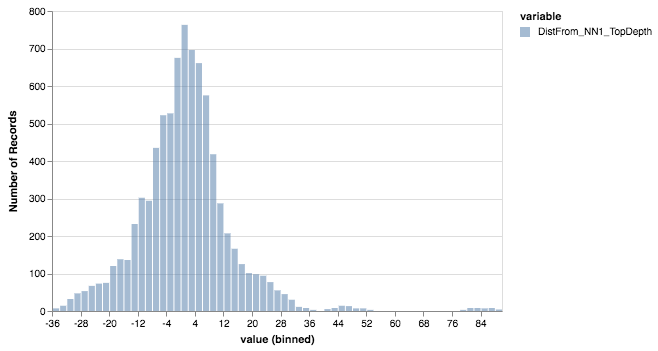

In [81]:
# 'MM_Top_Depth_predBy_NN1thick'
test_df_pred2_TopScratch2 = test_df_pred_onlyTopMCM_class5[['DistFrom_NN1_TopDepth']]
test_df_pred2_TopScratch2.vgplot.hist(bins=100, alpha=0.5)

In [82]:
test_df_pred_onlyTopMCM_class10 = test_df_pred.loc[test_df_pred['new_pick2'] == 10]

In [83]:
print(len(test_df_pred_onlyTopMCM_class10))

140


In [84]:
accuracy_class10 = accuracy_score(test_df_pred_onlyTopMCM_class10['new_pick2'], test_df_pred_onlyTopMCM_class10['Pick_pred'])
accuracy_class10

0.0

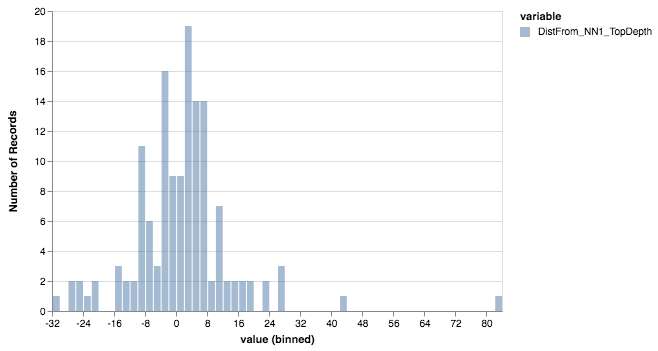

In [85]:
# 'MM_Top_Depth_predBy_NN1thick'
test_df_pred2_TopScratch2 = test_df_pred_onlyTopMCM_class10[['DistFrom_NN1_TopDepth']]
test_df_pred2_TopScratch2.vgplot.hist(bins=100, alpha=0.5)

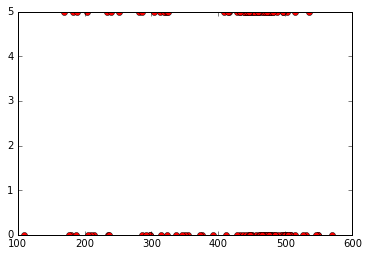

In [93]:
plt.plot(test_df_pred_onlyTopMCM_class10['DEPT'],test_df_pred_onlyTopMCM_class10['Pick_pred'], 'ro')

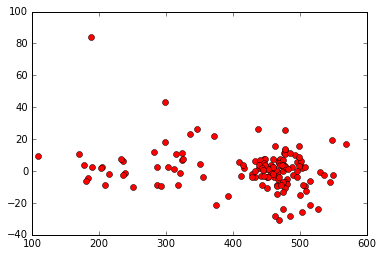

In [92]:
plt.plot(test_df_pred_onlyTopMCM_class10['DEPT'],test_df_pred_onlyTopMCM_class10['DistFrom_NN1_TopDepth'], 'ro')

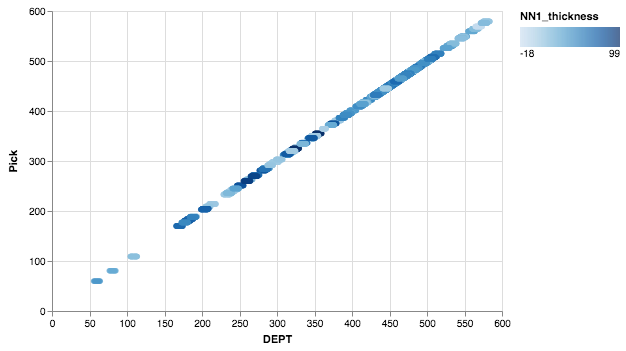

In [95]:
#c='McMurray_Base_DEPTH'
test_df_pred_onlyTopMCM_class5.vgplot(kind='scatter', x='DEPT', y='Pick',c='NN1_thickness')

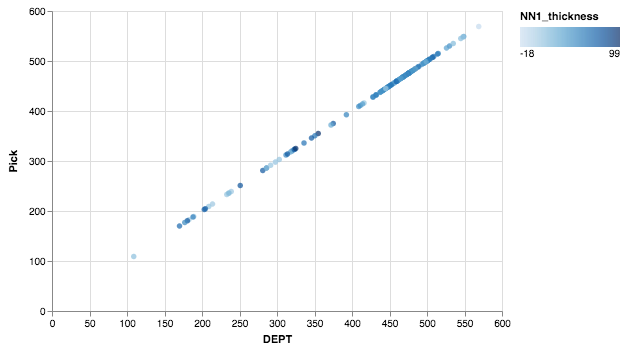

In [96]:
#c='McMurray_Base_DEPTH'
test_df_pred_onlyTopMCM_class10.vgplot(kind='scatter', x='DEPT', y='Pick',c='NN1_thickness')

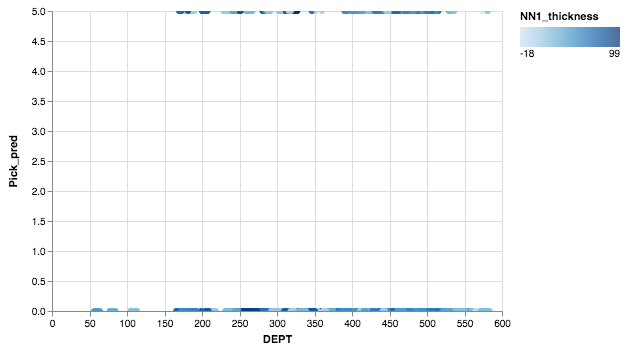

In [101]:
test_df_pred_onlyTopMCM_class5.vgplot(kind='scatter', x='DEPT', y='Pick_pred',c='NN1_thickness')

In [102]:
test_df_pred_onlyTopMCM_class10pred = test_df_pred.loc[test_df_pred['Pick_pred'] == 10]
len(test_df_pred_onlyTopMCM_class10pred)

0

In [52]:
test_df_pred[0:20]

,CALI,COND,DELT,DEPT,DPHI,DT,DistFrom_NN1_TopDepth,GR,GR_max_11winSize_dirabove,GR_max_11winSize_diraround,GR_max_21winSize_dirabove,GR_max_21winSize_diraround,GR_max_5winSize_dirabove,GR_max_5winSize_diraround,GR_max_7winSize_dirabove,GR_max_7winSize_diraround,GR_mean_11winSize_dirabove,GR_mean_11winSize_diraround,GR_mean_21winSize_dirabove,GR_mean_21winSize_diraround,GR_mean_5winSize_dirabove,GR_mean_5winSize_diraround,GR_mean_7winSize_dirabove,GR_mean_7winSize_diraround,GR_min_11winSize_dirabove,GR_min_11winSize_dirabove_n3,GR_min_11winSize_diraround,GR_min_11winSize_diraround_n3,GR_min_21winSize_dirabove,GR_min_21winSize_dirabove_n3,GR_min_21winSize_diraround,GR_min_21winSize_diraround_n3,GR_min_5winSize_dirabove,GR_min_5winSize_dirabove_n3,GR_min_5winSize_diraround,GR_min_5winSize_diraround_n3,GR_min_7winSize_dirabove,GR_min_7winSize_dirabove_n3,GR_min_7winSize_diraround,GR_min_7winSize_diraround_n3,HorID,HorID_paleoz,ILD,ILD_max_11winSize_dirabove,ILD_max_11winSize_diraround,ILD_max_21winSize_dirabove,ILD_max_21winSize_diraround,ILD_max_5winSize_dirabove,ILD_max_5winSize_diraround,ILD_max_7winSize_dirabove,ILD_max_7winSize_diraround,ILD_mean_11winSize_dirabove,ILD_mean_11winSize_diraround,ILD_mean_21winSize_dirabove,ILD_mean_21winSize_diraround,ILD_mean_5winSize_dirabove,ILD_mean_5winSize_diraround,ILD_mean_7winSize_dirabove,ILD_mean_7winSize_diraround,ILD_min_11winSize_dirabove,ILD_min_11winSize_dirabove_n3,ILD_min_11winSize_diraround,ILD_min_11winSize_diraround_n3,ILD_min_21winSize_dirabove,ILD_min_21winSize_dirabove_n3,ILD_min_21winSize_diraround,ILD_min_21winSize_diraround_n3,ILD_min_5winSize_dirabove,ILD_min_5winSize_dirabove_n3,ILD_min_5winSize_diraround,ILD_min_5winSize_diraround_n3,ILD_min_7winSize_dirabove,ILD_min_7winSize_dirabove_n3,ILD_min_7winSize_diraround,ILD_min_7winSize_diraround_n3,ILM,MM_Top_Depth_predBy_NN1thick,NN1_thickness,NPHI,PHID,Pick,Pick_paleoz,Quality,Quality_paleoz,RHOB,SFLU,SP,SitID,UWI,new_pick,new_pick2,new_pick2_paleoz,new_pick_paleoz,Pick_pred
0,NaN,NaN,NaN,100.00,0.272,NaN,78.00,85.425,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13000,14000,13.898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,178.0,6.0,0.507,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,82.50,0,0,84.00,0
1,NaN,NaN,NaN,100.25,0.283,NaN,77.75,84.199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13000,14000,9.392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,178.0,6.0,0.523,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,82.25,0,0,83.75,0
2,NaN,NaN,NaN,100.50,0.283,NaN,77.50,87.275,NaN,NaN,NaN,NaN,NaN,112.478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.1746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.199,98.749667,NaN,NaN,NaN,NaN,13000,14000,8.556,NaN,NaN,NaN,NaN,NaN,13.898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.4890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.509,10.615333,NaN,NaN,NaN,NaN,NaN,178.0,6.0,0.527,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,82.00,0,0,83.50,0
3,NaN,NaN,NaN,100.75,0.275,NaN,77.25,96.496,NaN,NaN,NaN,NaN,NaN,112.478,NaN,112.478,NaN,NaN,NaN,NaN,NaN,97.3568,NaN,96.847714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.199,105.103333,NaN,NaN,84.199,108.179667,13000,14000,8.090,NaN,NaN,NaN,NaN,NaN,9.392,NaN,13.898,NaN,NaN,NaN,NaN,NaN,8.2112,NaN,9.096143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.509,8.679333,NaN,NaN,7.509,10.669667,NaN,178.0,6.0,0.518,NaN,182.5,184.0,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,81.75,0,0,83.25,0
4,NaN,NaN,NaN,101.00,0.248,NaN,77.00,112.478,NaN,NaN,NaN,NaN,112.478,112.478,NaN,119.863,NaN,NaN,NaN,NaN,93.1746,101.6620,NaN,101.767429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.199,98.749667,87.275,108.179667,NaN,NaN,84.199,112.

In [43]:
len(test_df_pred.UWI.unique())

221

In [88]:
idx = test_df_pred.groupby(['SitID'])['Pick_pred'].transform(max) == test_df_pred['Pick_pred']
test_df_pred3=test_df_pred[idx]
        
        


In [89]:
len(test_df_pred3)

50222

In [87]:
# Score
final_score = np.sqrt(mean_squared_error(test_df_pred2['DEPT'],test_df_pred3['Pick']))
print("Prediction RMSE: {}".format(final_score))

Prediction RMSE: 92.30777425421681


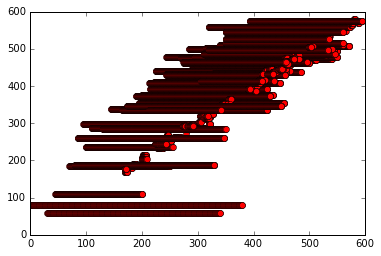

In [45]:
plt.plot(test_df_pred2['DEPT'],test_df_pred2['Pick'], 'ro')

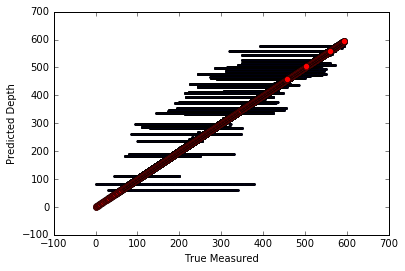

In [46]:
plt.scatter(test_df_pred2['DEPT'],test_df_pred2['Pick'], s=2)
plt.plot(test_df_pred2['DEPT'],test_df_pred2['DEPT'], 'ro')
#plt.plot([Y_all.min(), Y_all.max()], [Y_all.min(), Y_all.max()], 'k--', lw=2)
plt.xlabel('True Measured')
plt.ylabel('Predicted Depth')

In [47]:
import pdvega
import vega

In [48]:
test_df_pred2

,CALI,COND,DELT,DEPT,DPHI,DT,DistFrom_NN1_TopDepth,GR,GR_max_11winSize_dirabove,GR_max_11winSize_diraround,GR_max_21winSize_dirabove,GR_max_21winSize_diraround,GR_max_5winSize_dirabove,GR_max_5winSize_diraround,GR_max_7winSize_dirabove,GR_max_7winSize_diraround,GR_mean_11winSize_dirabove,GR_mean_11winSize_diraround,GR_mean_21winSize_dirabove,GR_mean_21winSize_diraround,GR_mean_5winSize_dirabove,GR_mean_5winSize_diraround,GR_mean_7winSize_dirabove,GR_mean_7winSize_diraround,GR_min_11winSize_dirabove,GR_min_11winSize_dirabove_n3,GR_min_11winSize_diraround,GR_min_11winSize_diraround_n3,GR_min_21winSize_dirabove,GR_min_21winSize_dirabove_n3,GR_min_21winSize_diraround,GR_min_21winSize_diraround_n3,GR_min_5winSize_dirabove,GR_min_5winSize_dirabove_n3,GR_min_5winSize_diraround,GR_min_5winSize_diraround_n3,GR_min_7winSize_dirabove,GR_min_7winSize_dirabove_n3,GR_min_7winSize_diraround,GR_min_7winSize_diraround_n3,HorID,HorID_paleoz,ILD,ILD_max_11winSize_dirabove,ILD_max_11winSize_diraround,ILD_max_21winSize_dirabove,ILD_max_21winSize_diraround,ILD_max_5winSize_dirabove,ILD_max_5winSize_diraround,ILD_max_7winSize_dirabove,ILD_max_7winSize_diraround,ILD_mean_11winSize_dirabove,ILD_mean_11winSize_diraround,ILD_mean_21winSize_dirabove,ILD_mean_21winSize_diraround,ILD_mean_5winSize_dirabove,ILD_mean_5winSize_diraround,ILD_mean_7winSize_dirabove,ILD_mean_7winSize_diraround,ILD_min_11winSize_dirabove,ILD_min_11winSize_dirabove_n3,ILD_min_11winSize_diraround,ILD_min_11winSize_diraround_n3,ILD_min_21winSize_dirabove,ILD_min_21winSize_dirabove_n3,ILD_min_21winSize_diraround,ILD_min_21winSize_diraround_n3,ILD_min_5winSize_dirabove,ILD_min_5winSize_dirabove_n3,ILD_min_5winSize_diraround,ILD_min_5winSize_diraround_n3,ILD_min_7winSize_dirabove,ILD_min_7winSize_dirabove_n3,ILD_min_7winSize_diraround,ILD_min_7winSize_diraround_n3,ILM,MM_Top_Depth_predBy_NN1thick,NN1_thickness,NPHI,PHID,Pick,Pick_paleoz,Quality,Quality_paleoz,RHOB,SFLU,SP,SitID,UWI,new_pick,new_pick2,new_pick2_paleoz,new_pick_paleoz,Pick_pred
298,NaN,NaN,NaN,174.500,0.194,NaN,3.500,45.190,48.867,94.370,48.867,96.841,48.867,71.622,48.867,87.604,38.413545,57.089545,41.529143,59.295190,42.4790,50.3518,37.102857,55.461429,21.820,48.649000,21.820,91.499000,21.820,48.848667,21.820,95.813667,31.042,46.208333,42.728,54.821000,21.820,46.208333,42.728,69.364333,13000,14000,5.164,25.221,15.821,57.309,25.221,14.961,9.039,15.821,13.376,14.554273,7.572636,29.986238,9.521571,9.8244,5.7208,11.537571,6.505143,5.164,21.171667,3.490,14.719333,5.164,57.305000,3.490,21.171667,5.164,12.458667,3.691,6.928333,5.164,15.534000,3.556,9.665667,NaN,178.00,6.00,0.387,NaN,182.50,184.00,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,8.000,0,0,9.500,5
299,NaN,NaN,NaN,174.750,0.202,NaN,3.250,47.651,48.867,94.370,48.867,96.841,48.867,87.604,48.867,92.523,38.360818,62.176818,41.883476,61.551714,45.8008,58.9590,40.266571,61.698000,21.820,48.455667,31.042,91.499000,21.820,48.848667,21.820,96.229667,42.728,47.236000,42.728,68.959000,21.820,47.236000,42.728,83.916333,13000,14000,4.128,20.928,14.961,57.309,20.928,13.376,6.582,15.821,9.039,12.636727,6.463818,27.454143,8.576000,7.6578,4.6242,9.867286,5.092857,4.128,18.038333,3.490,12.458667,4.128,56.268000,3.490,18.038333,4.128,9.665667,3.556,5.291333,4.128,14.719333,3.490,6.928333,NaN,178.00,6.00,0.387,NaN,182.50,184.00,3,1,NaN,NaN,NaN,117838,00/10-12-089-18W4/0,7.750,0,0,9.250,5
300,NaN,NaN,NaN,175.000,0.212,NaN,3.000,71.622,71.622,94.370,71.622,96.841,71.622,92.523,71.622,94.370,40.431091,65.867364,43.086476,63.164429,50.3518,68.9180,47.381143,68.812571,21.820,56.046667,42.728,91.499000,21.820,56.446000,21.820,96.229667,42.728,54.821000,45.190,83.916333,31.042,56.046667,42.728,91.499000,13000,14000,3.691,17.366,13.376,57.309,17.366,9.039,5.164,14.961,6.582,11.069727,5.445727,24.901143,7.830143,5.7208,4.0058,8.134429,4.300286,3.691,16.335667,3.490,9.665667,3.691,54.247667,3.490,16.335667,3.691,6.928333,3.490,4.327667,3.691,12.458667,3.490,5.291333,NaN,178.00,6.00,0.425,NaN,182.50

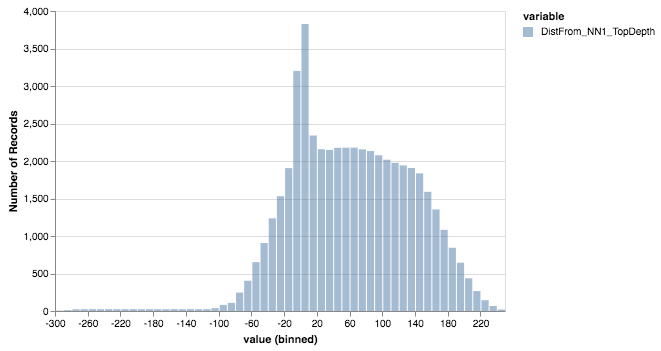

In [49]:
# 'MM_Top_Depth_predBy_NN1thick'
test_df_pred2_TopScratch2 = test_df_pred2[['DistFrom_NN1_TopDepth']]
test_df_pred2_TopScratch2.vgplot.hist(bins=100, alpha=0.5)

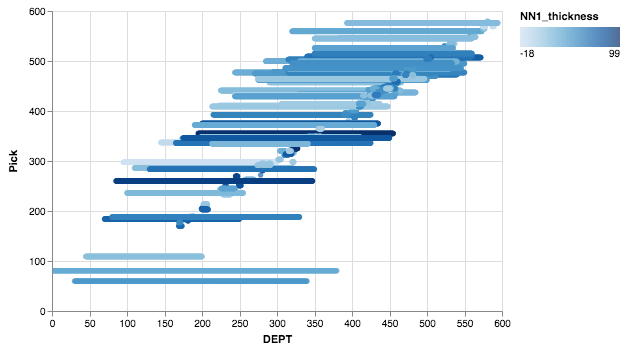

In [50]:
#c='McMurray_Base_DEPTH'
test_df_pred2.vgplot(kind='scatter', x='DEPT', y='Pick',c='NN1_thickness')

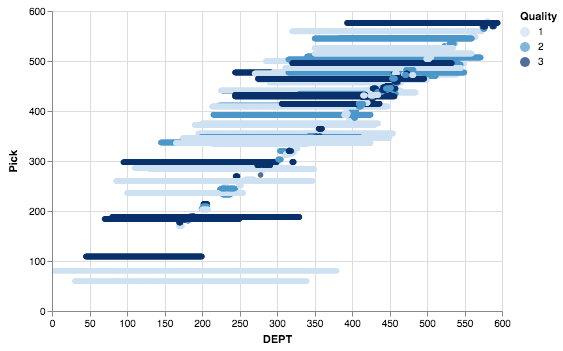

In [51]:
#c='McMurray_Base_DEPTH'
test_df_pred2.vgplot(kind='scatter', x='DEPT', y='Pick',c='Quality')